In [1]:
library(tidyverse)
library(Seurat)

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.2 ──
✔ ggplot2 3.3.6      ✔ purrr   0.3.4 
✔ tibble  3.1.8      ✔ dplyr   1.0.10
✔ tidyr   1.2.1      ✔ stringr 1.4.1 
✔ readr   2.1.2      ✔ forcats 0.5.2 
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
Attaching SeuratObject

Attaching sp



In [6]:
da_results = qs::qread('_targets/objects/nonzero_mean_df_Astrocytes___obob5v5')
da_results %>% head

,nonzero_mean,nonzero_sum
,<dbl>,<dbl>
ATGATCGTCCATCAGA_4_1,-2.079239,-118.51663
CTCATTATCGAGTGGA_2_2,-1.422611,-110.96364
TCCTTTCTCATTATCC_5_1,-1.764291,-98.80032
CAGATCACAGCGTGCT_5_2,-2.030206,-97.44989
ATTCGTTAGCCAGACA_5_1,-2.075883,-93.41473
AACGTCATCTGCGTCT_4_1,-1.841785,-92.08926


In [7]:
milo_obj = qs::qread('_targets/objects/milo_Agrp')

In [8]:
da_results = qs::qread('_targets/objects/da_results_nhg_Agrp___all.obob5v5__v__all.obobBL6')

In [9]:
sample_col = "hash.mcl.ID"

In [10]:
grouping_col = 'restored_grouping'

In [11]:
subset_groups = 'pos.unchanged_none'

In [12]:
tag = 'blah'

In [13]:
nhm = qs::qread('_targets/objects/nhm_Agrp___obob5v5')

In [76]:
exp_other = qs::qread('../00_preprocessing/_targets/objects/exp_labelled_neuron')
# exp_other = qs::qread('_targets/objects/obj_Agrp')

In [15]:
nhm %>% head

,1,2,3,4,5,6,7,8,9,10,⋯,307,308,309,310,311,312,313,314,315,316
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
CTCTGGTCAACCAACT_1_1,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
ACATTTCCACCTGTCT_1_1,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
CTGGTCTCACCTATCC_1_1,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
TTCCACGGTCATCCCT_1_1,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
TCATGGATCATACGAC_1_1,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
CTAACCCAGTCACAGG_1_1,0,0,0,1,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0


In [16]:
da_results %>% head

,logFC,logCPM,F,PValue,FDR,Nhood,SpatialFDR,polarity,labels,labels_fraction,comparison,restored,restored_grouping,fgf1_grouping
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<chr>,<lgl>,<chr>,<chr>
1,2.783338,12.74004,22.30446,1.349637e-05,0.004264853,6,0.004498133,pos,Agrp,1,all.obob5v5__v__all.obobBL6,FALSE,pos,pos
2,3.712655,12.04923,16.29367,1.565390e-04,0.012976679,76,0.013269869,pos,Agrp,1,all.obob5v5__v__all.obobBL6,FALSE,pos,pos
3,-2.689194,12.59104,14.82204,3.063996e-04,0.012976679,111,0.013269869,neg,Agrp,1,all.obob5v5__v__all.obobBL6,TRUE,neg,neg
4,-2.129494,12.90311,15.67906,2.114120e-04,0.012976679,207,0.013269869,neg,Agrp,1,all.obob5v5__v__all.obobBL6,TRUE,neg,neg
5,3.599030,12.16847,14.82507,2.823407e-04,0.012976679,209,0.013269869,pos,Agrp,1,all.obob5v5__v__all.obobBL6,FALSE,pos,pos
6,-2.652013,12.51812,14.65563,3.285235e-04,0.012976679,237,0.013269869,neg,Agrp,1,all.obob5v5__v__all.obobBL6,TRUE,neg,neg


In [17]:
pos_nhoods = da_results %>%
filter(fgf1_grouping == 'pos') %>%
pull(Nhood)

In [18]:
neg_nhoods = da_results %>%
filter(fgf1_grouping == 'neg') %>%
pull(Nhood)

In [19]:
neg_nhoods

[1] 111 207 237 239   8 122 149 231 194 130 152 185   5 281 299  94 142 206 258
[20]  14 165 221 268 308  85 283  67 196 170 116 192 224

In [20]:
pos_nhoods

[1]   6  76 209 296  95 251 250 136 107 227 291  23 240  36 121 162 245  58 244
[20]  53 238

In [21]:
nhood_sums_pos = nhm[,pos_nhoods] %>% 
rowSums %>% 
enframe(name = 'cell_id', value='nhood_count_pos') %>%
filter(nhood_count_pos > 0) %>%
arrange(desc(nhood_count_pos)) %>%
as.data.frame
nhood_sums_pos %>% head

,cell_id,nhood_count_pos
,<chr>,<dbl>
1,AAGATAGGTCTCTCCA_4_2,9
2,ATCGTCCAGCGACTTT_5_2,9
3,CTGCATCTCCGAACGC_2_2,7
4,TTTACCACACTGGATT_3_2,7
5,CACTTCGGTAAGTAGT_4_2,7
6,TTCAGGAGTTCGTTCC_4_2,7


In [22]:
nhood_sums_neg = nhm[,neg_nhoods] %>% 
rowSums %>% 
enframe(name = 'cell_id', value='nhood_count_neg') %>%
filter(nhood_count_neg > 0) %>%
arrange(desc(nhood_count_neg)) %>%
as.data.frame
nhood_sums_neg %>% head

,cell_id,nhood_count_neg
,<chr>,<dbl>
1,ACACCAAAGATCCTAC_5_2,10
2,CCTAACCAGTGATTCC_2_2,9
3,TGTAAGCTCCTAAGTG_2_2,8
4,CGATCGGTCGCTAGCG_3_2,8
5,GCACGGTAGACGACGT_5_2,8
6,CAACGGCGTGTGATGG_2_3,8


In [23]:
# exp_other@meta.data = exp_other@meta.data %>% select(-nhood_count)

In [24]:
exp_other@meta.data = exp_other@meta.data %>%
mutate(cell_id = rownames(.)) %>%
left_join(nhood_sums_pos, by = "cell_id") %>%
left_join(nhood_sums_neg, by = "cell_id") %>%
column_to_rownames("cell_id") %>%
mutate(nhood_count_pos = tidyr::replace_na(nhood_count_pos,0)) %>%
mutate(nhood_count_neg = tidyr::replace_na(nhood_count_neg,0))

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



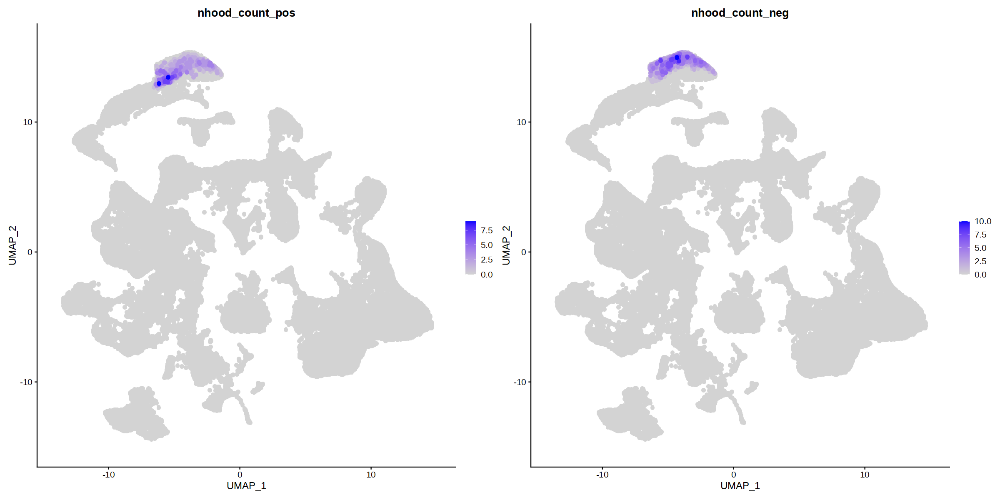

In [25]:
DefaultAssay(exp_other) = "RNA"
options(repr.plot.width=20, repr.plot.height=10)
fp = FeaturePlot(exp_other,
            features = c("nhood_count_pos", "nhood_count_neg"),
           pt.size=5,
           order=TRUE,
           raster=TRUE,
           raster.dpi=c(1024, 1024),
           ncol=2
           )
fp

In [26]:
deg_results = qs::qread('_targets/objects/deg_ensmus_Agrp___all.obob5v5__v__all.obobBL6___fgf1_grouping.pos')
top10g = deg_results %>% filter(.[[3]] < 0.05) %>% pull(GeneID) %>% head(9)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



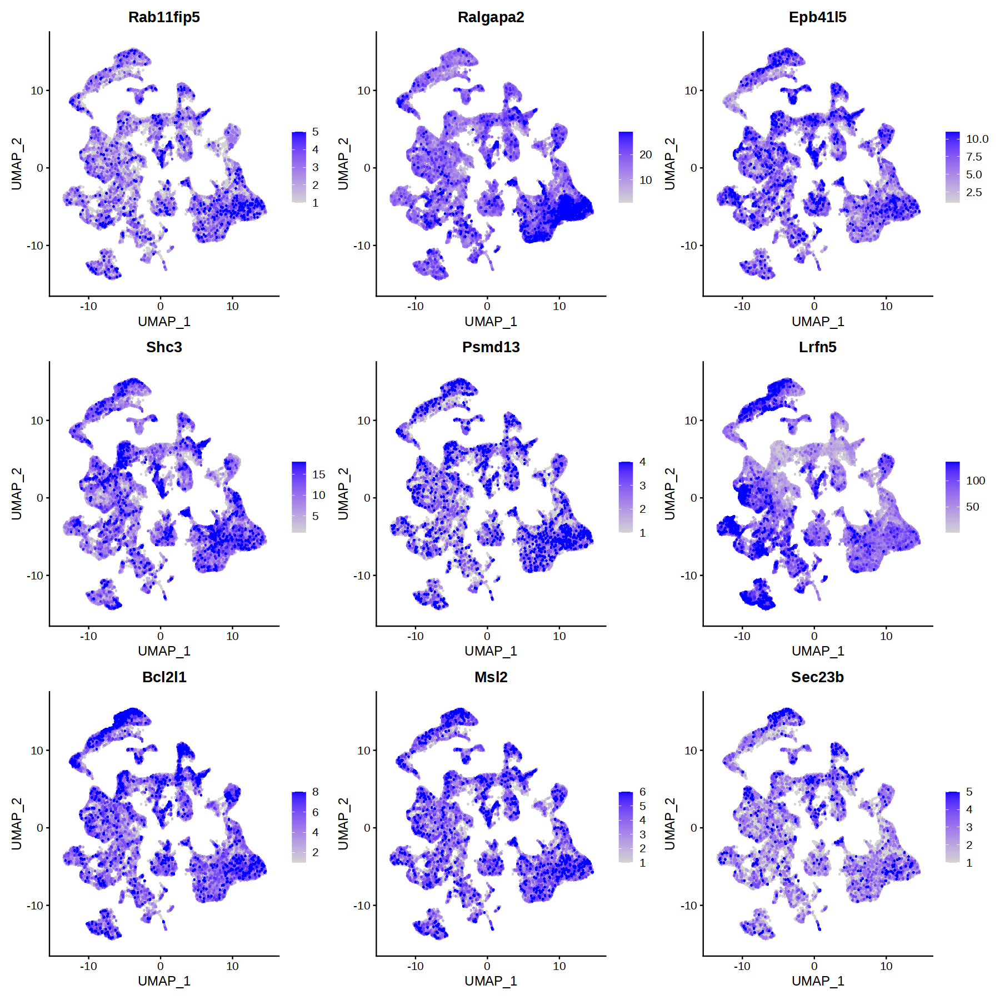

In [27]:
DefaultAssay(exp_other) = "RNA"
options(repr.plot.width=15, repr.plot.height=15)
fp = FeaturePlot(exp_other,
            features = top10g,
           pt.size=5,
           order=TRUE,
           min.cutoff="q01",
           max.cutoff="q99",
           raster=TRUE,
           raster.dpi=c(1024, 1024),
           ncol=3
           )
fp

In [55]:
exp_other_local = qs::qread('_targets/objects/obj_Agrp')

In [29]:
exp_other_local@meta.data = exp_other_local@meta.data %>%
mutate(cell_id = rownames(.)) %>%
left_join(nhood_sums_pos, by = "cell_id") %>%
left_join(nhood_sums_neg, by = "cell_id") %>%
column_to_rownames("cell_id") %>%
mutate(nhood_count_pos = tidyr::replace_na(nhood_count_pos,0)) %>%
mutate(nhood_count_neg = tidyr::replace_na(nhood_count_neg,0))

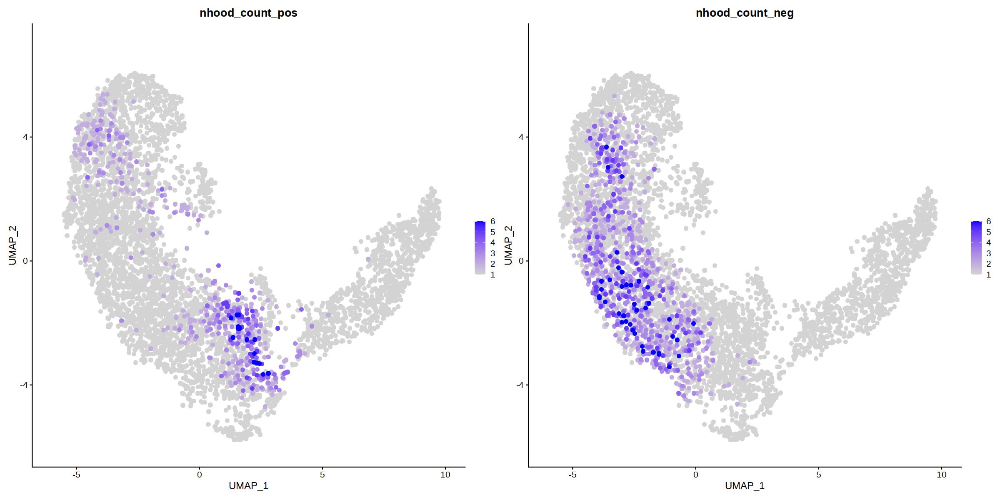

In [30]:
DefaultAssay(exp_other) = "RNA"
options(repr.plot.width=20, repr.plot.height=10)
fp = FeaturePlot(exp_other_local,
            features = c("nhood_count_pos", "nhood_count_neg"),
           pt.size=5,
           order=TRUE,
           min.cutoff="q01",
           max.cutoff="q99",
           raster=TRUE,
           raster.dpi=c(1024, 1024),
           ncol=2
           )
fp

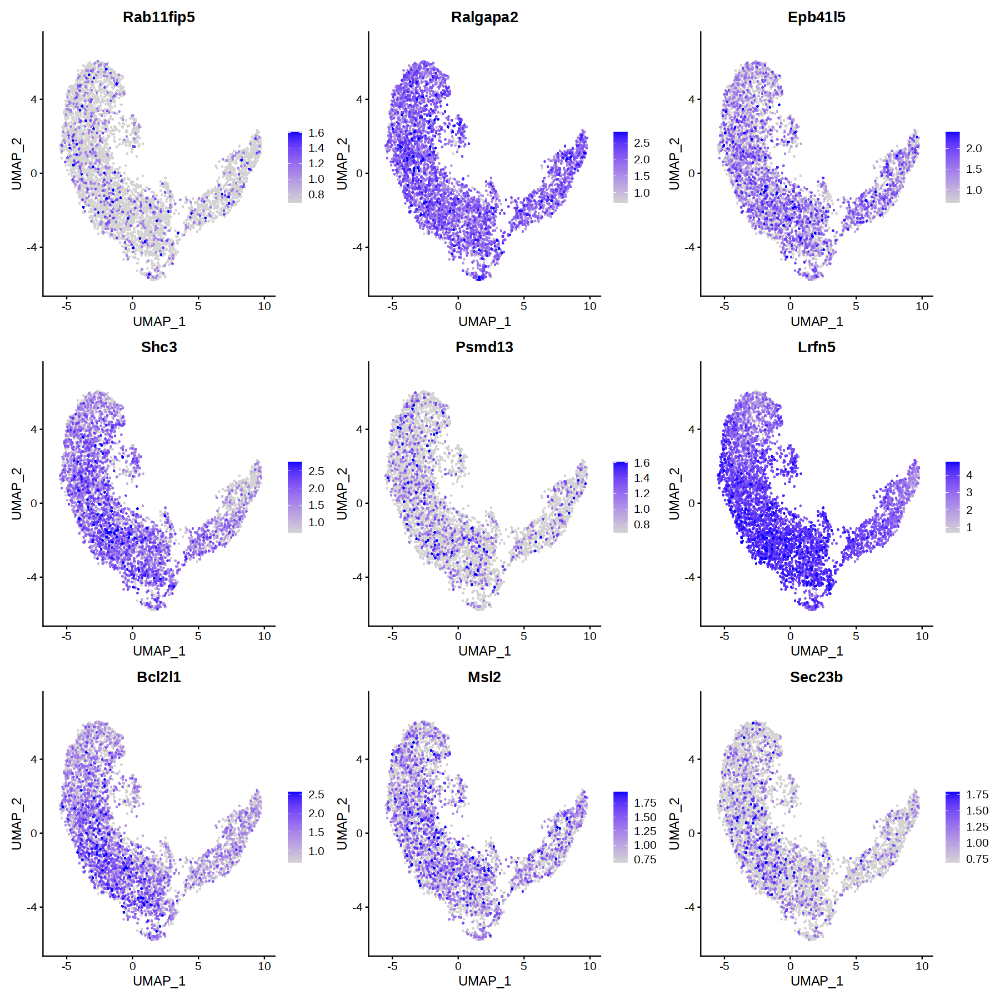

In [31]:
DefaultAssay(exp_other) = "RNA"
options(repr.plot.width=15, repr.plot.height=15)
fp = FeaturePlot(exp_other_local,
            features = top10g,
           pt.size=5,
           order=TRUE,
           min.cutoff="q01",
           max.cutoff="q99",
           raster=TRUE,
           raster.dpi=c(1024, 1024),
           ncol=3
           )
fp

In [32]:
pos_cells = exp_other_local@meta.data %>% filter(nhood_count_pos > 0) %>% rownames

In [33]:
pos_markers = Seurat::FindMarkers(exp_other_local, ident.1=pos_cells, slot="data", assay="SCT", verbose=TRUE)

In [34]:
2

[1] 2

In [35]:
pos_markers = pos_markers %>%
mutate(gsea_sort_score = (-log10(.[[1]]))) %>%
mutate(gsea_sort_score = .[[2]] * gsea_sort_score) %>%
arrange(desc(gsea_sort_score))

In [36]:
pos_markers %>% head

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,gsea_sort_score
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Cntn5,5.202252e-97,1.0532983,0.968,0.842,1.118588e-92,101.41557
Schip1,1.050736e-36,1.1776652,0.933,0.923,2.259293e-32,42.37064
Nrg1,1.383379e-41,1.0061684,0.920,0.871,2.974541e-37,41.11109
Galntl6,1.348742e-43,0.7899689,0.906,0.832,2.900064e-39,33.86602
Syt1,9.256502e-48,0.6255068,0.983,0.939,1.990333e-43,29.41981
Grik2,3.998019e-59,0.4876734,1.000,1.000,8.596540e-55,28.47923


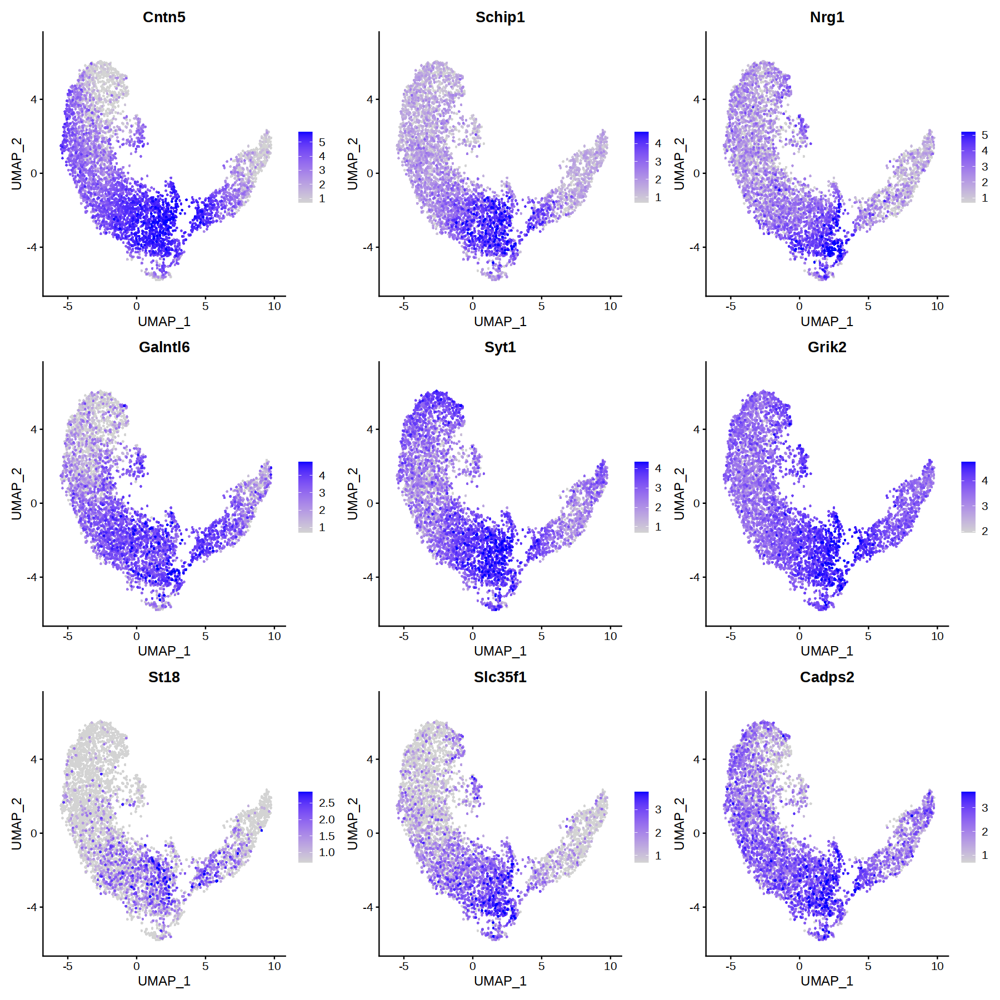

In [37]:
top10g_markers = pos_markers %>% filter(p_val_adj < 0.05) %>% rownames %>% head(9)
DefaultAssay(exp_other) = "RNA"
options(repr.plot.width=15, repr.plot.height=15)
fp = FeaturePlot(exp_other_local,
            features = top10g_markers,
           pt.size=5,
           order=TRUE,
           min.cutoff="q01",
           max.cutoff="q99",
           raster=TRUE,
           raster.dpi=c(1024, 1024),
           ncol=3
           )
fp

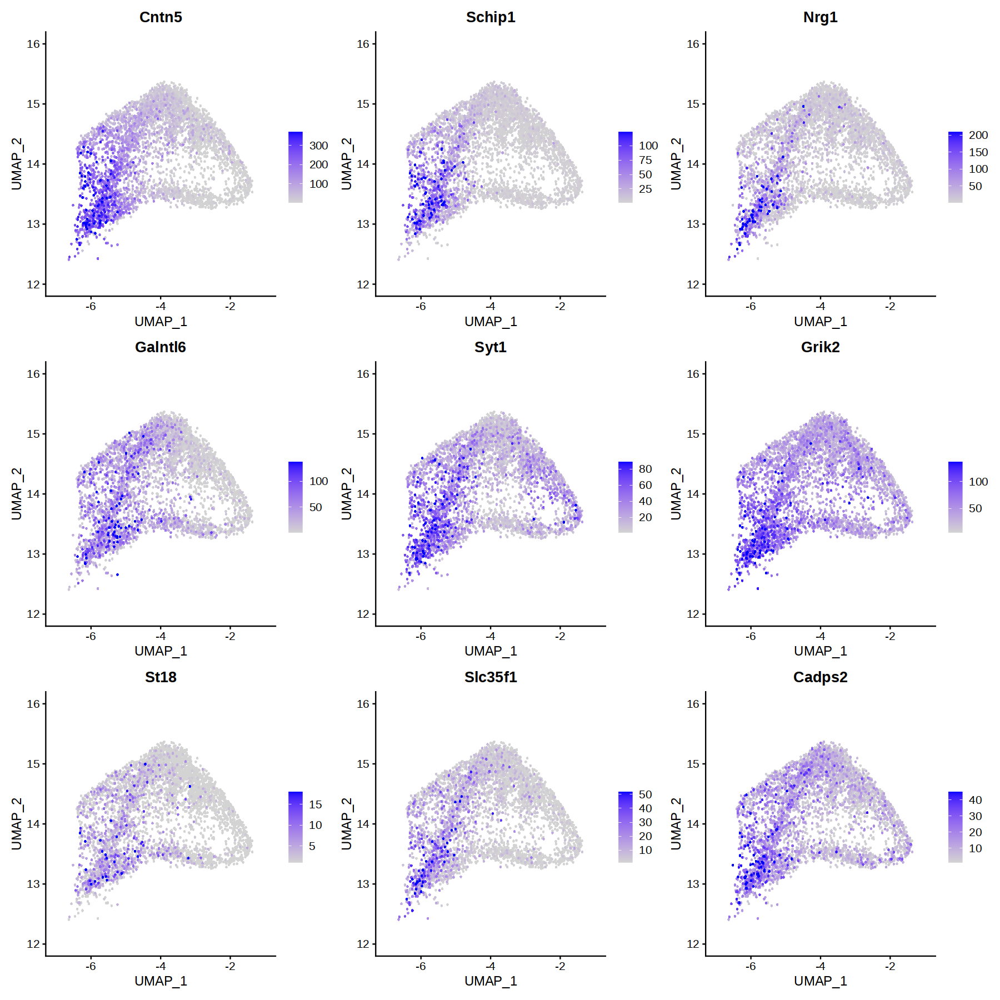

In [38]:
top10g_markers = pos_markers %>% filter(p_val_adj < 0.05) %>% rownames %>% head(9)
DefaultAssay(exp_other) = "RNA"
options(repr.plot.width=15, repr.plot.height=15)
fp = FeaturePlot(exp_other,
            features = top10g_markers,
           pt.size=5,
           order=TRUE,
           min.cutoff="q01",
           max.cutoff="q99",
           raster=TRUE,
           raster.dpi=c(1024, 1024),
           ncol=3,
           cells = exp_other@meta.data %>% filter(labels == 'Agrp') %>% rownames
           )
fp

In [39]:
exp_other_local@meta.data %>% head

,orig.ident,nCount_RNA,nFeature_RNA,Index.10x,nCount_HTO,nFeature_HTO,Index.HTO,nCount_spliced,nFeature_spliced,nCount_unspliced,⋯,isolation_date,batch,predicted.id,prediction.score.max,labels,group,nCount_integrated,nFeature_integrated,nhood_count_pos,nhood_count_neg
,<chr>,<dbl>,<int>,<chr>,<dbl>,<int>,<chr>,<dbl>,<int>,<dbl>,⋯,<chr>,<chr>,<chr>,<dbl>,<chr>,<fct>,<dbl>,<int>,<dbl>,<dbl>
CTCTGGTCAACCAACT_1_1,SI-TT-A11,45637,6699,SI-TT-A11,1469,12,D706,6648,2967,38989,⋯,22/6/2022,Batch__1,Agrp,0.9722932,Agrp,Veh_PF.Day14.BL6,0,0,1,0
ACATTTCCACCTGTCT_1_1,SI-TT-A11,46101,6596,SI-TT-A11,1867,12,D706,6942,3035,39159,⋯,22/6/2022,Batch__1,Agrp,1.0000000,Agrp,Veh_PF.Day14.obob,0,0,0,3
CTGGTCTCACCTATCC_1_1,SI-TT-A11,44580,6655,SI-TT-A11,1959,12,D706,6968,3093,37612,⋯,22/6/2022,Batch__1,Agrp,1.0000000,Agrp,Veh_PF.Day5.BL6,0,0,0,0
TTCCACGGTCATCCCT_1_1,SI-TT-A11,43179,6595,SI-TT-A11,1632,12,D706,6747,2989,36432,⋯,22/6/2022,Batch__1,Agrp,0.9747831,Agrp,Veh_PF.Day14.obob,0,0,0,1
TCATGGATCATACGAC_1_1,SI-TT-A11,42633,6211,SI-TT-A11,1788,12,D706,6839,2832,35794,⋯,22/6/2022,Batch__1,Agrp,1.0000000,Agrp,Veh_PF.Day5.obob,0,0,0,0
CTAACCCAGTCACAGG_1_1,SI-TT-A11,42012,6643,SI-TT-A11,2312,12,D706,7514,3342,34498,⋯,22/6/2022,Batch__1,Agrp,0.9928776,Agrp,FGF1.Day5.obob,0,0,0,2


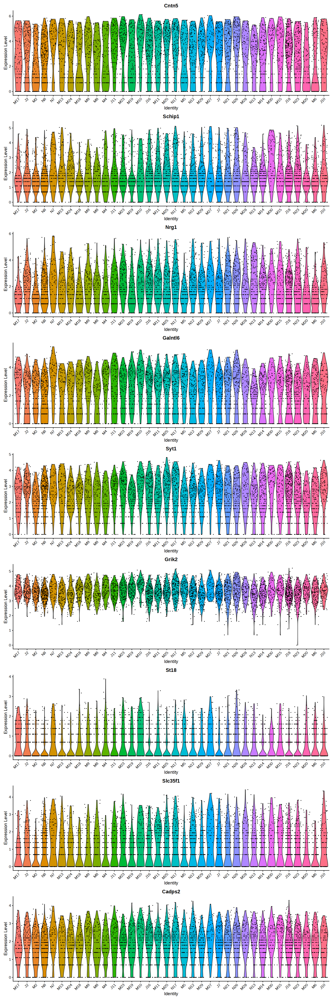

In [40]:
options(repr.plot.width=15, repr.plot.height=45)
Idents(exp_other_local) = exp_other_local@meta.data$hash.mcl.ID
VlnPlot(exp_other_local, features = top10g_markers, ncol = 1)

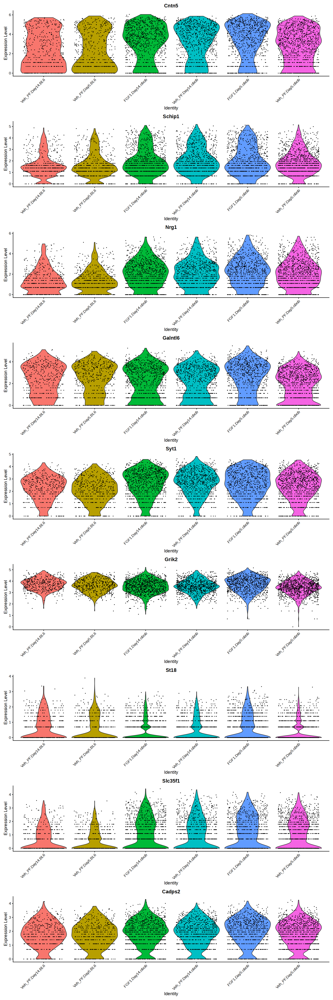

In [41]:
options(repr.plot.width=15, repr.plot.height=45)
# exp_f = subset(exp_f, cells = )
Idents(exp_other_local) = exp_other_local@meta.data$group
VlnPlot(exp_other_local, features = top10g_markers, ncol = 1)

In [43]:
neg_cells = exp_other_local@meta.data %>% filter(nhood_count_neg > 0) %>% rownames

Warning message:
“Groups with fewer than two data points have been dropped.”
Warning message:
“Groups with fewer than two data points have been dropped.”
Warning message:
“Groups with fewer than two data points have been dropped.”
Warning message:
“Groups with fewer than two data points have been dropped.”
Warning message:
“Groups with fewer than two data points have been dropped.”
Warning message:
“Groups with fewer than two data points have been dropped.”
Warning message:
“Groups with fewer than two data points have been dropped.”
Warning message:
“Groups with fewer than two data points have been dropped.”
Warning message:
“Groups with fewer than two data points have been dropped.”


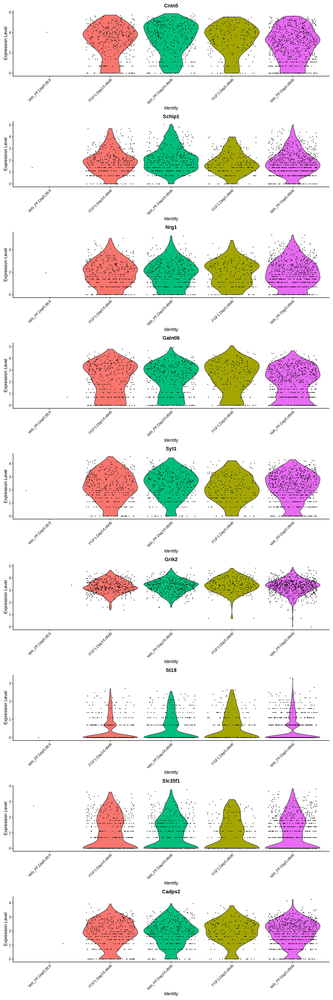

In [44]:
options(repr.plot.width=15, repr.plot.height=45)
exp_f = subset(exp_other_local, cells = neg_cells)
Idents(exp_f) = exp_f@meta.data$group
VlnPlot(exp_f, features = top10g_markers, ncol = 1)

In [59]:
pldf = qs::qread('_targets/objects/pldf_Agrp___obob5v5')
pldf = pldf %>% rownames_to_column(var = 'cell_id') 
pldf %>% head

,cell_id,polar_label
,<chr>,<chr>
1,CTCTGGTCAACCAACT_1_1,Agrp.pos
2,ACATTTCCACCTGTCT_1_1,Agrp.neg
3,CTGGTCTCACCTATCC_1_1,Agrp.none
4,TTCCACGGTCATCCCT_1_1,Agrp.none
5,TCATGGATCATACGAC_1_1,Agrp.none
6,CTAACCCAGTCACAGG_1_1,Agrp.none


In [72]:
exp_other_local@meta.data = exp_other_local@meta.data %>%
mutate(cell_id = rownames(.)) %>%
left_join(pldf, by='cell_id') %>%
column_to_rownames('cell_id')

In [73]:
options(repr.plot.width=5, repr.plot.height=30)
# exp_f = subset(exp_f, cells = )
Idents(exp_other_local) = exp_other_local@meta.data$polar_label
VlnPlot(exp_other_local, features = top10g_markers, ncol = 1)

ERROR: Error in rep_len(x = value, length.out = length(x = cells)): cannot replicate NULL to a non-zero length


In [74]:
selected_cells = exp_other_local@meta.data %>% filter(polar_label == 'Agrp.pos') %>% rownames
exp_subset_f = subset(exp_other_local, cells = selected_cells)

ERROR: [1m[33mError[39m in [1m[1m`filter()`:[22m
[1m[22m[33m![39m Problem while computing `..1 = polar_label == "Agrp.pos"`.
[1mCaused by error in [1m[1m`mask$eval_all_filter()`:[22m
[33m![39m object 'polar_label' not found


In [75]:
exp_other_local@meta.data

,orig.ident,nCount_RNA,nFeature_RNA,Index.10x,nCount_HTO,nFeature_HTO,Index.HTO,nCount_spliced,nFeature_spliced,nCount_unspliced,⋯,isolation_date,batch,predicted.id,prediction.score.max,labels,group,nCount_integrated,nFeature_integrated,polar_label.x,polar_label.y
,<chr>,<dbl>,<int>,<chr>,<dbl>,<int>,<chr>,<dbl>,<int>,<dbl>,⋯,<chr>,<chr>,<chr>,<dbl>,<chr>,<fct>,<dbl>,<int>,<chr>,<chr>
1,SI-TT-A11,45637,6699,SI-TT-A11,1469,12,D706,6648,2967,38989,⋯,22/6/2022,Batch__1,Agrp,0.9722932,Agrp,Veh_PF.Day14.BL6,0,0,Agrp.pos,NA
2,SI-TT-A11,46101,6596,SI-TT-A11,1867,12,D706,6942,3035,39159,⋯,22/6/2022,Batch__1,Agrp,1.0000000,Agrp,Veh_PF.Day14.obob,0,0,Agrp.neg,NA
3,SI-TT-A11,44580,6655,SI-TT-A11,1959,12,D706,6968,3093,37612,⋯,22/6/2022,Batch__1,Agrp,1.0000000,Agrp,Veh_PF.Day5.BL6,0,0,Agrp.none,NA
4,SI-TT-A11,43179,6595,SI-TT-A11,1632,12,D706,6747,2989,36432,⋯,22/6/2022,Batch__1,Agrp,0.9747831,Agrp,Veh_PF.Day14.obob,0,0,Agrp.none,NA
5,SI-TT-A11,42633,6211,SI-TT-A11,1788,12,D706,6839,2832,35794,⋯,22/6/2022,Batch__1,Agrp,1.0000000,Agrp,Veh_PF.Day5.obob,0,0,Agrp.none,NA
6,SI-TT-A11,42012,6643,SI-TT-A11,2312,12,D706,7514,3342,34498,⋯,22/6/2022,Batch__1,Agrp,0.9928776,Agrp,FGF1.Day5.obob,0,0,Agrp.none,NA
7,SI-TT-A11,40651,6362,SI-TT-A11,1371,12,D706,7076,3121,33575,⋯,22/6/2022,Batch__1,Agrp,1.0000000,Agrp,FGF1.Day14.obob,0,0,Agrp.none,NA
8,SI-TT-A11,40249,5920,SI-TT-A11,2038,12,D706,5801,2510,34448,⋯,22/6/2022,Batch__1,Agrp,1.0000000,Agrp,Veh_PF.Day14.obob,0,0,Agrp.none,NA
9,SI-TT-A11,39327,6278,SI-TT-A11,1682,12,D706,5516,2680,33811,⋯,22/6/2022,Batch__1,Agrp,1.0000000,Agrp,Veh_PF.Day14.obob,0,0,Agrp.none,NA


In [68]:
exp_other_local@meta.data

orig.ident,nCount_RNA,nFeature_RNA,Index.10x,nCount_HTO,nFeature_HTO,Index.HTO,nCount_spliced,nFeature_spliced,nCount_unspliced,⋯,isolation_date,batch,predicted.id,prediction.score.max,labels,group,nCount_integrated,nFeature_integrated,cell_id,polar_label
<chr>,<dbl>,<int>,<chr>,<dbl>,<int>,<chr>,<dbl>,<int>,<dbl>,⋯,<chr>,<chr>,<chr>,<dbl>,<chr>,<fct>,<dbl>,<int>,<chr>,<chr>
SI-TT-A11,45637,6699,SI-TT-A11,1469,12,D706,6648,2967,38989,⋯,22/6/2022,Batch__1,Agrp,0.9722932,Agrp,Veh_PF.Day14.BL6,0,0,CTCTGGTCAACCAACT_1_1,Agrp.pos
SI-TT-A11,46101,6596,SI-TT-A11,1867,12,D706,6942,3035,39159,⋯,22/6/2022,Batch__1,Agrp,1.0000000,Agrp,Veh_PF.Day14.obob,0,0,ACATTTCCACCTGTCT_1_1,Agrp.neg
SI-TT-A11,44580,6655,SI-TT-A11,1959,12,D706,6968,3093,37612,⋯,22/6/2022,Batch__1,Agrp,1.0000000,Agrp,Veh_PF.Day5.BL6,0,0,CTGGTCTCACCTATCC_1_1,Agrp.none
SI-TT-A11,43179,6595,SI-TT-A11,1632,12,D706,6747,2989,36432,⋯,22/6/2022,Batch__1,Agrp,0.9747831,Agrp,Veh_PF.Day14.obob,0,0,TTCCACGGTCATCCCT_1_1,Agrp.none
SI-TT-A11,42633,6211,SI-TT-A11,1788,12,D706,6839,2832,35794,⋯,22/6/2022,Batch__1,Agrp,1.0000000,Agrp,Veh_PF.Day5.obob,0,0,TCATGGATCATACGAC_1_1,Agrp.none
SI-TT-A11,42012,6643,SI-TT-A11,2312,12,D706,7514,3342,34498,⋯,22/6/2022,Batch__1,Agrp,0.9928776,Agrp,FGF1.Day5.obob,0,0,CTAACCCAGTCACAGG_1_1,Agrp.none
SI-TT-A11,40651,6362,SI-TT-A11,1371,12,D706,7076,3121,33575,⋯,22/6/2022,Batch__1,Agrp,1.0000000,Agrp,FGF1.Day14.obob,0,0,ATCCCTGAGACCAGCA_1_1,Agrp.none
SI-TT-A11,40249,5920,SI-TT-A11,2038,12,D706,5801,2510,34448,⋯,22/6/2022,Batch__1,Agrp,1.0000000,Agrp,Veh_PF.Day14.obob,0,0,GGTGGCTCAAGGGTCA_1_1,Agrp.none
SI-TT-A11,39327,6278,SI-TT-A11,1682,12,D706,5516,2680,33811,⋯,22/6/2022,Batch__1,Agrp,1.0000000,Agrp,Veh_PF.Day14.obob,0,0,TCCCACAAGGGACAGG_1_1,Agrp.none


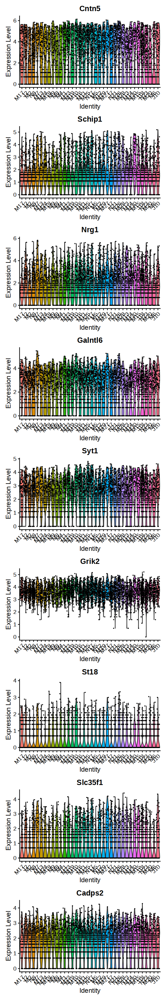

In [64]:
options(repr.plot.width=5, repr.plot.height=30)
Idents(exp_other_local) = exp_other_local@meta.data$hash.mcl.ID
VlnPlot(exp_other_local, features = top10g_markers, ncol = 1)